# Image Processing Basics
```
P.M Ranasinghe
20/08/2022

```
<hr style="height:5px">

### Images in Computer

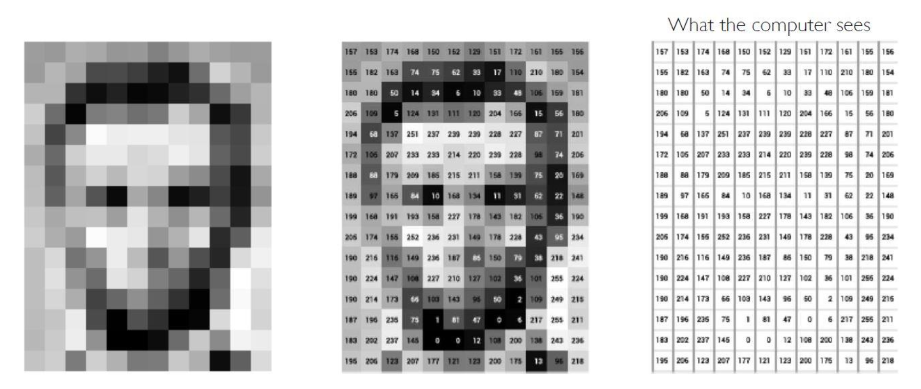

## Main Images Formats
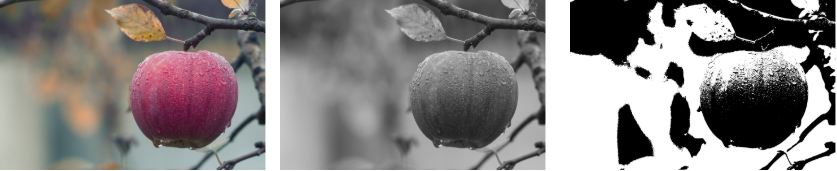

### Pixel Representation
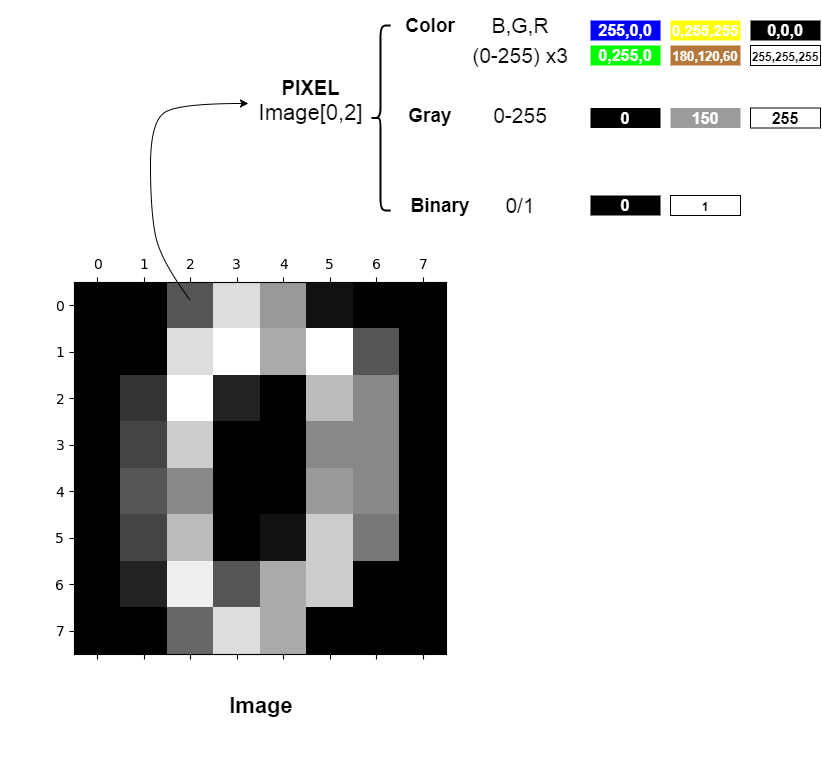


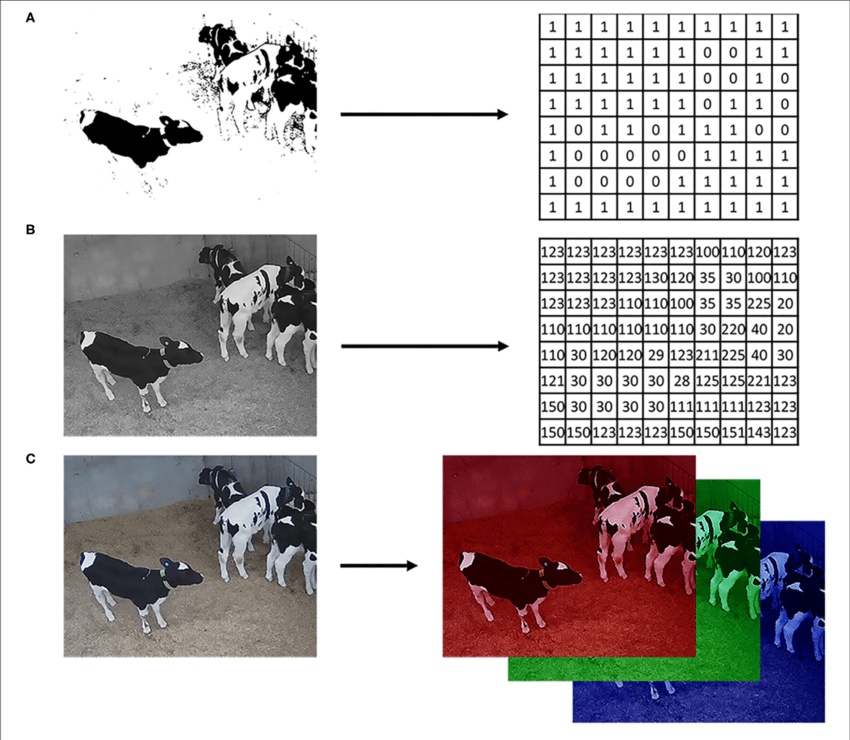

**Installing required libraries**

``
pip install numpy
pip install opencv-python
pip install matplotlib
``

<h2>Introduction to Opencv</h2>
<h2>1. How to load a image</h3>

In [2]:
import cv2 #imporing thr opencv module

#img=cv2.imread(r'D:\#Image Processing\Resources\Lenna.png',1) #absolute path 
img=cv2.imread('Resources\Lenna.png') #relative path

#2: Unchanged: Image with alpha channel
#1: Loads a color image. 
#0: Loads image in grayscale mode

cv2.imshow('IMAGE',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [2]:
#Check the resolution of the image
print(img.shape)

(512, 512, 3)


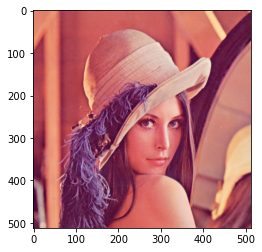

In [3]:
#Use of matplotlib package
from matplotlib import pyplot as plt

img=plt.imread("Resources\Lenna.png")
plt.imshow(img)

**1.1 Use of cmap** <br>
Finding a colormap to find a good representation in 3D colorspace for image representation.

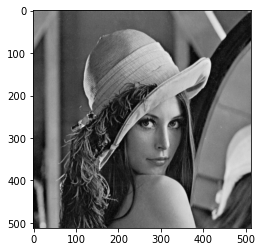

In [4]:
from matplotlib import pyplot as plt

img=plt.imread("Resources\Lenna.png")
plt.imshow(img[:,:,1],cmap='gray')
#plt.colorbar()

<h2>2 Capture an Image using webcam/external camera</h3>

In [5]:
import cv2

source=cv2.VideoCapture(0)
#0-webcam
#1,2,3=usb camera
#myVideo.mp4-file
#1.35.2.43.633 user name - wifi camera

_,img=source.read()

cv2.imshow('IMG',img)
cv2.waitKey(0)
cv2.imwrite("Capure_imag.jpg",img)

cv2.destroyAllWindows()

<h2>3. How to load a video file</h2>

In [6]:
import cv2

source=cv2.VideoCapture("Resources/Sample.mp4")
#0-webcam
#1,2,3=usb camera
#myVideo.mp4-file
#1.35.2.43.633 user name - wifi camera

while(True):
    ret,img=source.read()
    if(ret==False):
        break
    
    cv2.imshow('IMG',img)
    key=cv2.waitKey(1)
    if(key==27):
        break
    
cv2.destroyAllWindows()

cv2.waitKey() is a keyboard binding function. Its argument is the time in milliseconds. The function waits for specified milliseconds for any keyboard event. If you press any key in that time, the program continues. If 0 is passed, it waits indefinitely for a key stroke. It can also be set to detect specific key strokes like, if key a is pressed etc which we will discuss below.

read more about ```cv2.waitKey()``` function

[Keyboard ASCII values](https://progtpoint.blogspot.com/2017/06/key-board-ascii-key-code.html) 



## 4. Basic Functions

### 4.1 Cropping and Saving Images</h3>


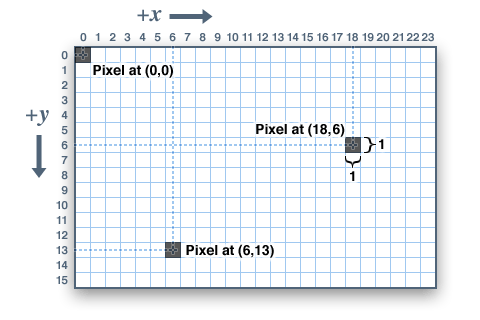

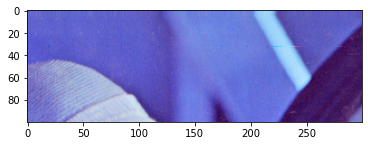

In [7]:
#Cropping of images
img = cv2.imread('Resources\Lenna.png')

#Getting a portion of the image
img_cropped=img[0:100,200:500] 
plt.imshow(img_cropped)

### 4.2 Color Conversion

In [8]:
img_gray=cv2.imread('Resources\Lenna.png',0) #gray Scale
img_col=cv2.imread('Resources\Lenna.png',1) #Colour Image


print(img_gray.shape)
print(img_col.shape)

cv2.imshow('IMG_GRAY',img_gray)
cv2.imshow('IMG_COLOUR',img_col)

cv2.waitKey(0)
cv2.destroyAllWindows()
#press any key to destroy all windows

(512, 512)
(512, 512, 3)


<h3> 4.3 Change the Colorspaces</h3>

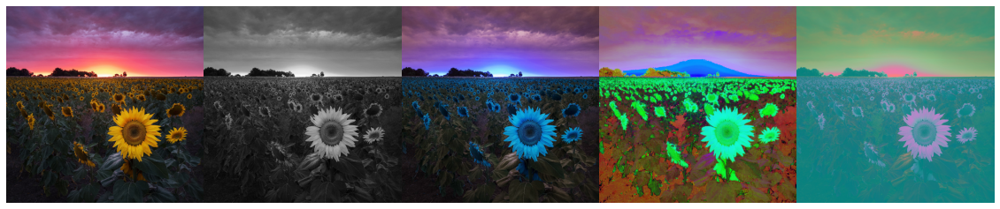

In [78]:
#img=cv2.imread('Resources\Lenna.png')
img=cv2.imread('Resources/flower.jpg')

img_RGB=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img_converted=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
img_converted_2=cv2.cvtColor(img,cv2.COLOR_BGR2Lab)
img_converted_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#Subplots in matplotlib
plt.figure(figsize=(20,10))
plt.subplots_adjust(wspace=0, hspace=0)
plt.subplot(1, 5, 1)
plt.imshow(img_RGB)
plt.axis('off')

plt.subplot(1, 5, 2)
plt.imshow(img_converted_gray,cmap="gray")
plt.axis('off')

plt.subplot(1, 5, 3)
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 5, 4)
plt.imshow(img_converted)
plt.axis('off')

plt.subplot(1, 5, 5)
plt.imshow(img_converted_2)
plt.axis('off')

plt.savefig("Color.png",dpi=100)
#cv2.imshow('IMG',img)
#cv2.imshow('IMG_CONVERTED',img_converted)

#cv2.waitKey(0)
#cv2.destroyAllWindows()


There are more than 150 color-space conversion methods available in OpenCV. But we will look into only two which are most widely used ones, BGR \leftrightarrow Gray and BGR \leftrightarrow HSV.

1. [Tutorialspoint Digital Image Processing](https://www.tutorialspoint.com/dip/grayscale_to_rgb_conversion.htm)
2. [Availabe colourspaces](https://docs.opencv.org/3.4.0/d7/d1b/group__imgproc__misc.html#ga4e0972be5de079fed4e3a10e24ef5ef0)

#### BGR ----> Gray using a basic python operations

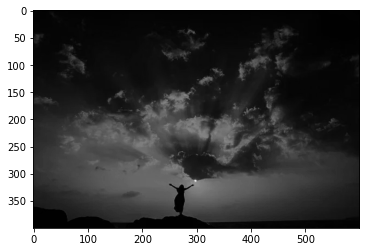

In [10]:
##BGR to Gray scale ---> Point Operations
import cv2
import numpy as np
from matplotlib import pyplot as plt

def bgr2gray(img):
    row,cols,_=img.shape
    img_gray= np.zeros((row,cols,1))
    for i in range(row):
        for j in range(cols):
            img_gray[i,j]=img[i,j,0]*0.299+img[i,j,1]*0.587+img[i,j,2]*0.144
    return img_gray

img = cv2.imread('Resources/img_2.jpg')
myImg=bgr2gray(img)

plt.imshow(myImg, cmap ='gray')

In [11]:
print(img.shape,myImg.shape)

(400, 600, 3) (400, 600, 1)


### 4.4 Write/Draw on a image

https://docs.opencv.org/4.x/d6/d6e/group__imgproc__draw.html

In [12]:
#Draw Line,Rectange/circle 

img=cv2.imread('Resources/Lenna.png')
cv2.line(img, (10,10), (50,125), (0,255,5), 5) 
cv2.line(img, (100,100), (500,225), (255,255,5), 5)

cv2.rectangle(img, (450,250), (400,450), (255,255,255), -1) 

cv2.rectangle(img, (200,200), (350,400), (14,255,15),4) 
cv2.rectangle(img, (198,200), (300,170), (0,255,0), -1) 
cv2.putText(img,"Lenna",(205,196),cv2.FONT_HERSHEY_SIMPLEX,1,(12,45,31),2)

cv2.circle(img, (450,50),30, (12,34,23),-1)
cv2.putText(img,"ABC",(25,450),cv2.FONT_HERSHEY_SIMPLEX,3,(12,45,31),5)

cv2.imshow('IMAGE',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

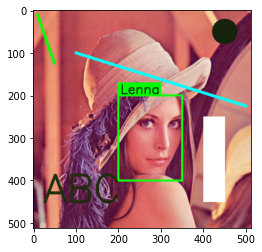

In [13]:
plt.imshow(img[:,:,::-1])

<h3>4.5 Image Thresholding</h3>

<p>In thresholding, if a pixel value is greater than a threshold value, it is assigned one value (may be white), else it is assigned another value (may be black). The function used is cv2.threshold. <br>First argument is the source image, which should be a grayscale image. Second argument is the threshold value which is used to classify the pixel values. Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value. OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:</p>

<table align="left">
    <tr>
        <th>cv2.THRESH_BINARY</th>
    </tr>
    <tr>
        <th>cv2.THRESH_BINARY_INV</th>
    </tr>
    <tr>
        <th>cv2.THRESH_TRUNCV</th>
    </tr>
    <tr>
        <th>cv2.THRESH_TOZEROV</th>
    </tr>
    <tr>
        <th>cv2.THRESH_TOZERO_INV</th>
    </tr>
</table>

### 4.5 Thresholding 

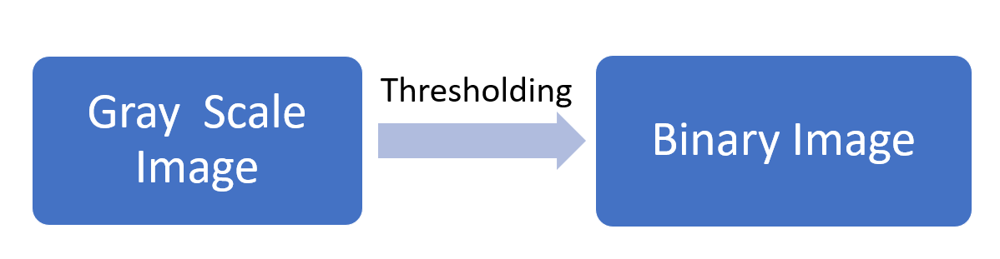

(-0.5, 511.5, 511.5, -0.5)

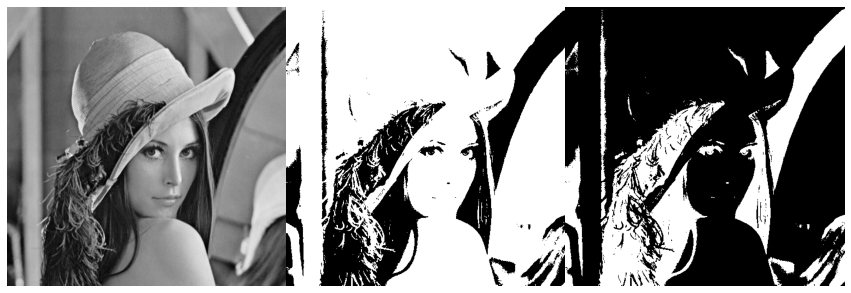

In [14]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

#Loading image ingray scale
img = cv2.imread('Resources\Lenna.png',0)

ret,thresh_1=cv2.threshold(img,100,255,cv2.THRESH_BINARY)
ret,thresh_2=cv2.threshold(img,100,255,cv2.THRESH_BINARY_INV)

#Subplots in matplotlib
plt.figure(figsize=(15,8))
plt.subplots_adjust(wspace=0, hspace=0)

plt.subplot(1, 3, 1)
plt.imshow(img,cmap ='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(thresh_1,cmap ='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(thresh_2,cmap ='gray')
plt.axis('off')

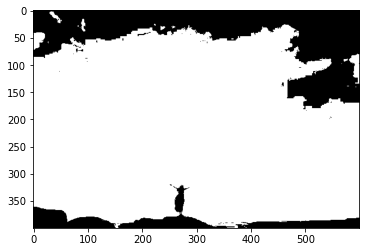

In [15]:
#Function for Binary Thresholding 

def myThresh(img,thresh):
    row,cols=img.shape
    for i in range(row):
        for j in range(cols):
            if(img[i,j]>thresh):
                img[i,j]=255.0
            else:
                img[i,j]=0.0
    return img

img = cv2.imread('Resources/img_2.jpg',0)
myImg=myThresh(img,10)

plt.imshow(img, cmap ='gray')


<h3>4.6 Image Negatives</h3>

In [16]:
# Read original image
image = cv2.imread('Resources/Lenna.png')

# Max intensity 
L = np.amax(image)

# Subtract each intensity from max to obtain negative
negative = L - image

cv2.imshow('original', image)
cv2.imshow('negative', negative)
cv2.waitKey(0)
cv2.destroyAllWindows()


(-0.5, 511.5, 511.5, -0.5)

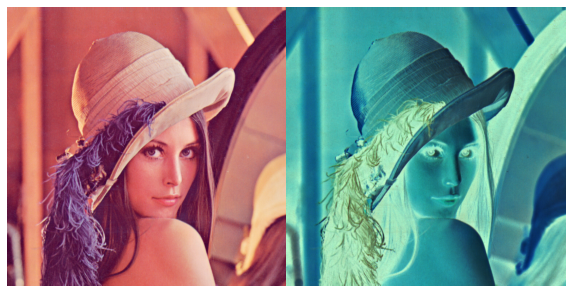

In [17]:
#Subplots in matplotlib

plt.figure(figsize=(10,8))
plt.subplots_adjust(wspace=0, hspace=0)
plt.subplot(1, 2, 1)
plt.imshow(image[:,:,::-1])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(negative[:,:,::-1])
plt.axis('off')

### 4.7 Adjust Contrast and Brightness

In [79]:
image = cv2.imread('Resources\Lenna.png')
new_image = np.zeros(image.shape, image.dtype)

alpha=2
beta=2

for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            new_image[y,x,c] = np.clip(alpha*image[y,x,c] + beta, 0, 255)

cv2.imshow('Original Image', image)
cv2.imshow('New Image', new_image)

# Wait until user press some key
cv2.waitKey()
cv2.destroyAllWindows()

(-0.5, 511.5, 511.5, -0.5)

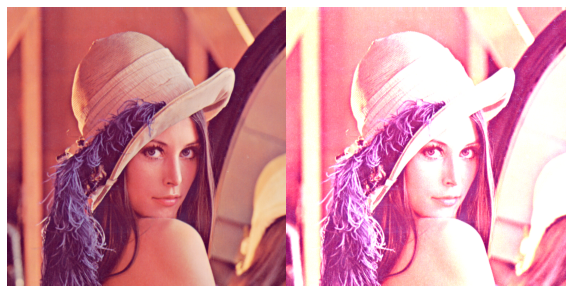

In [80]:
#Subplots in matplotlib
plt.figure(figsize=(10,8))
plt.subplots_adjust(wspace=0, hspace=0)

plt.subplot(1, 2, 1)
plt.imshow(image[:,:,::-1])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(new_image[:,:,::-1])
plt.axis('off')


### 4.8 Histogram Equalization

In [81]:
import cv2

img = cv2.imread('Resources\hist.jpg',0)
equ = cv2.equalizeHist(img)

#Stack images
res = np.hstack((img,equ)) 

cv2.imshow('Result',res)
cv2.waitKey()
cv2.destroyAllWindows()

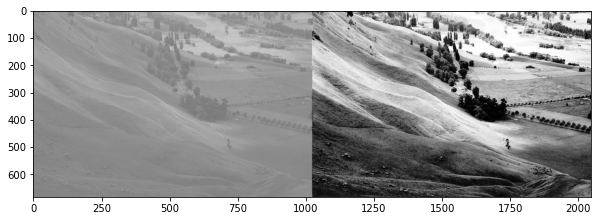

In [85]:
plt.figure(figsize=(10,6))
plt.imshow(res,cmap="gray")

### 4.9 Bluring

In [86]:
img = cv2.imread('Resources/flower.jpg')
# Kernel for box blur filter
# It is a unity matrix which is divided by 9 
box_blur_ker = 1/16*np.ones((4,4))
  
# Applying Box Blur effect
# Using the cv2.filter2D() function
# kernel is used for specifying the kernel operation (here, box_blur_ker)
Box_blur = cv2.filter2D(src=img, ddepth=-1, kernel=box_blur_ker)
gaussian_blur = cv2.GaussianBlur(src=img, ksize=(5,5),sigmaX=0, sigmaY=0)
median_blur = cv2.medianBlur(src=img, ksize=5)

(-0.5, 799.5, 799.5, -0.5)

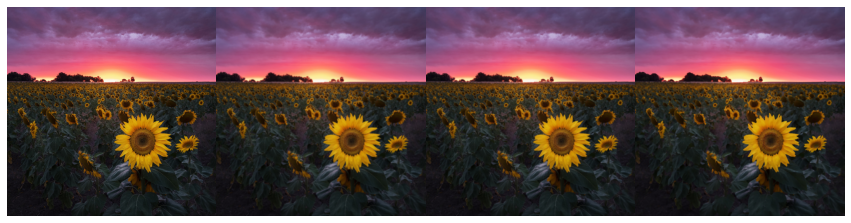

In [87]:
#Subplots in matplotlib 
plt.figure(figsize=(15,8))
plt.subplots_adjust(wspace=0, hspace=0)

plt.subplot(1, 4, 1)
plt.imshow(img[:,:,::-1])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(Box_blur[:,:,::-1])
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(gaussian_blur[:,:,::-1])
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(median_blur[:,:,::-1])
plt.axis('off')

### 4.10 Emboss

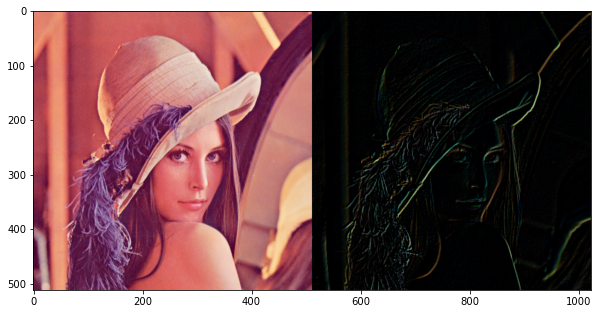

In [90]:
#Emboss
img = cv2.imread('Resources/Lenna.png')

emboss_kernel = np.array([[1,0, 0], [0, 0, 0], [0, 0, -1]]) 
emboss_img = cv2.filter2D(src=img, ddepth=-1, kernel=emboss_kernel) 

res = np.hstack((img,emboss_img)) 
cv2.imshow('Result',res)
cv2.waitKey()
cv2.destroyAllWindows()

plt.figure(figsize=(10,6))
plt.imshow(res[:,:,::-1])

### 4.11 Edge detection

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

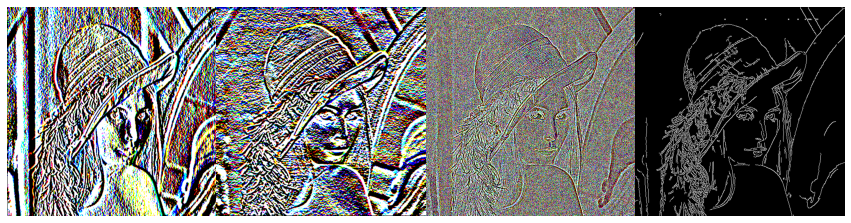

In [91]:
#Edge detection
import cv2
from matplotlib import pyplot as plt
img = cv2.imread('Resources/Lenna.png')

laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)  # x
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)  # y
canny=cv2.Canny(img,100,200)

#Subplots in matplotlib
plt.figure(figsize=(15,8))
plt.subplots_adjust(wspace=0, hspace=0)

plt.subplot(1, 4, 1)
plt.imshow(sobelx,cmap ='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(sobely,cmap ='gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(laplacian,cmap ='gray')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(canny,cmap ='gray')
plt.axis('off')

### 4.12 Erosion and Dilation

(-0.5, 899.5, 899.5, -0.5)

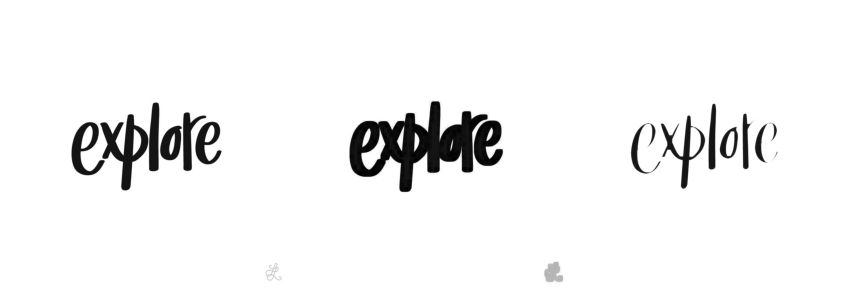

In [92]:
#erosion and dilation
img = cv2.imread('Resources/th.jpg')

kernel = np.ones((10,10), np.uint8)
img_erosion = cv2.erode(img, kernel, iterations=1)
img_dilation = cv2.dilate(img, kernel, iterations=1)


#Subplots in matplotlib
plt.figure(figsize=(15,10))
plt.subplots_adjust(wspace=0, hspace=0)

plt.subplot(1, 3, 1)
plt.imshow(img[:,:,::-1])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_erosion[:,:,::-1])
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_dilation[:,:,::-1])
plt.axis('off')

## 5 Countour Operations
#### What are contours?

Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.

For better accuracy, use binary images. So before finding contours, apply threshold or canny edge detection.
<br>
In OpenCV, finding contours is like finding white object from black background. So remember, object to be found should be white and background should be black.

See, there are three arguments in cv.findContours() function, first one is source image, second is contour retrieval mode, third is contour approximation method. And it outputs a modified image, the contours and hierarchy. contours is a Python list of all the contours in the image. Each individual contour is a Numpy array of (x,y) coordinates of boundary points of the object.

[Contours Introduction-OpenCV official Documentation](https://docs.opencv.org/master/d4/d73/tutorial_py_contours_begin.html)

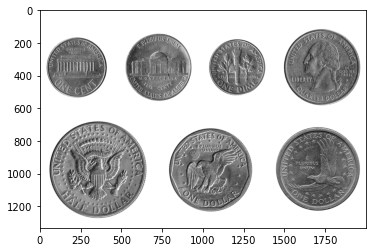

In [93]:
import cv2
from matplotlib import pyplot as plt

#Load image in grayscale
img = cv2.imread('Resources/coins.jpg',0)
plt.imshow(img,cmap='gray')

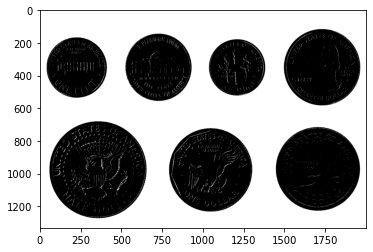

In [94]:
#Thresholding to get a binary image
ret,thresh=cv2.threshold(img,240,255,cv2.THRESH_BINARY)
plt.imshow(thresh,cmap='gray')

### 5.1 Find and draw Contours

Number of COntours detected : 4886


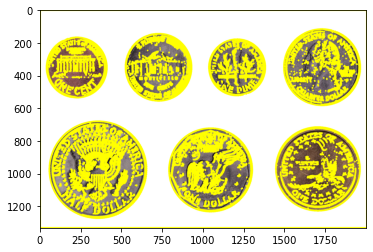

In [95]:
import cv2

img = cv2.imread('Resources/coins.jpg')

#Load image in grayscale
img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#binary Image
ret, thresh = cv2.threshold(img_gray,180, 255,cv2.THRESH_BINARY)

#finding Contours
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of COntours detected : {len(contours)}")

cv2.drawContours(img, contours, -1, (0,255,255), 10)

img_resized=cv2.resize(img,(0,0),fx=0.5,fy=0.5)
cv2.imshow('IMAGE',img_resized)
plt.imshow(img[:,:,::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

### 5.2 Contour filtering using area and number of sides

Number of COntours detected : 4886


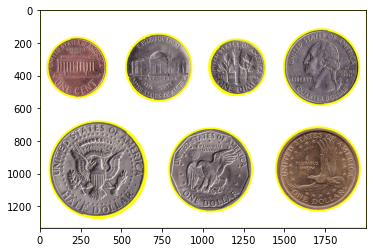

In [96]:
import cv2

img = cv2.imread('Resources/coins.jpg')
img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#binary Image
ret, thresh = cv2.threshold(img_gray,180, 255,cv2.THRESH_BINARY)

#finding Contours
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of COntours detected : {len(contours)}")

for cnt in contours:
    area=cv2.contourArea(cnt)
    if(area>5000):
        cv2.drawContours(img, [cnt], -1, (0,255,255),10)

img_resized=cv2.resize(img,(0,0),fx=0.5,fy=0.5)
cv2.imshow('IMAGE',img_resized)
plt.imshow(img[:,:,::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

### 5.3 Contours with bounding rectangles

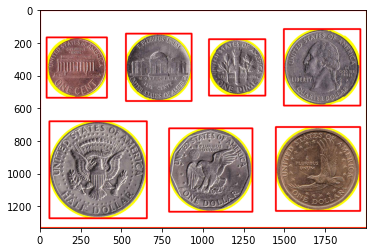

In [97]:
img = cv2.imread('Resources/coins.jpg')
imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 200, 255,cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area=cv2.contourArea(cnt)
    #print(area)
    if(area>18000):
        cv2.drawContours(img, [cnt], -1, (0,255,255),10)
        x,y,w,h = cv2.boundingRect(cnt)
        #print(x,y,w,h)
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),10)

img_resized=cv2.resize(img,(0,0),fx=0.5,fy=0.5)
cv2.imshow('IMAGE',img_resized)
plt.imshow(img[:,:,::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

### 5.4 Example - Finding area and the polygon type of the given contour

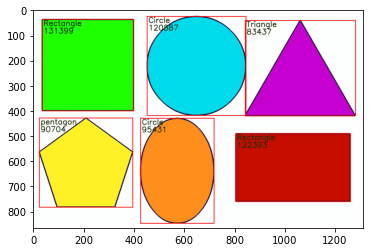

In [98]:
import cv2

img = cv2.imread('Resources/shapes.png')
imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(imgray,230, 255,cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    area=cv2.contourArea(cnt)
    if(area>50000 and area<200000):
        cv2.drawContours(img, [cnt], -1, (65,25,35),3)
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.putText(img,str(int(area)),(x+5,y+55),cv2.FONT_HERSHEY_SIMPLEX,1,(12,45,31),2)
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),2)
        
        approx = cv2.approxPolyDP(cnt, 0.009 * cv2.arcLength(cnt, True), True)
        No_legs=len(approx)
        if No_legs==3:
            polygon="Triangle"
        elif No_legs==4:
            polygon="Rectangle"
        elif No_legs==5:
            polygon="pentagon"
        elif No_legs==6:
            polygon="Hexagon"
        else:
            polygon="Circle"
        
        cv2.putText(img,polygon,(x+5,y+25),cv2.FONT_HERSHEY_SIMPLEX,1,(12,45,31),2)
            
img_resized=cv2.resize(img,(0,0),fx=0.8,fy=0.8)
cv2.imshow('IMAGE',img_resized)
plt.imshow(img[:,:,::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

### 5.5 Contour detection in a live video-feed

In [ ]:
import cv2

source=cv2.VideoCapture("Resources/Sample.mp4")
#0-webcam
#1,2,3=usb camera
#myVideo.mp4-file
#124.35.32.43.643 p/w user name - wifi camera
while(True):
    
    ret,img=source.read()    
    if(ret==False):
        break
    
    imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray,120, 255,cv2.THRESH_BINARY)

    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        area=cv2.contourArea(cnt)
        if(area>18000):
            cv2.drawContours(img, [cnt], -1, (0,255,255), 2)
            x,y,w,h = cv2.boundingRect(cnt)
            cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),2)

    cv2.imshow('thresh',thresh)
    cv2.imshow('img',img)
    key=cv2.waitKey(10)
    
    if(key==27):
        break
    
cv2.destroyAllWindows()

## 6. Colour Segmentation

In [99]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

img = cv2.imread('Resources\Cricket.JPG')
hsv=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

upper=np.array((74,72,152))
lower=np.array((179,255,255))

mask=cv2.inRange(hsv,upper,lower)
res=cv2.bitwise_and(img,img,mask=mask)

cv2.imshow("Segmented Image",res)
cv2.waitKey()
cv2.destroyAllWindows()

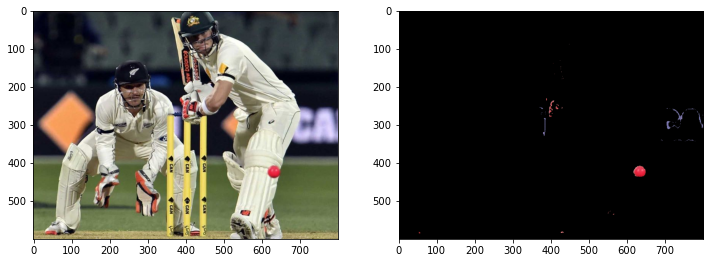

In [100]:
plt.figure(figsize=(12,5))
plt.subplot(1,2, 1)
plt.imshow(img[:,:,::-1])

plt.subplot(1,2, 2)
plt.imshow(res)
plt.imshow(res[:,:,::-1])

In [ ]:
#%%Colur Segmentation
# in OpenCV, h value: 0-180 (Red 0-60,Green 60-120, Blue 120-180)
# s value: 0-255
# v value: 0-255

import cv2
import numpy as np


frameWidth = 640
frameHeight = 480

Img_path = "Resources\plants\D8.png"
    
def empty(a):
    pass

cv2.namedWindow("HSV")
cv2.resizeWindow("HSV",640,240)
cv2.createTrackbar("HSV MIN","HSV",0,179,empty)
cv2.createTrackbar("HSV MAX","HSV",179,179,empty)
cv2.createTrackbar("SAT MIN","HSV",0,255,empty)
cv2.createTrackbar("SAT MAX","HSV",255,255,empty)
cv2.createTrackbar("VALUE MIN","HSV",0,255,empty)
cv2.createTrackbar("VALUE MAX","HSV",255,255,empty)
    
while True:
    img = cv2.imread(Img_path)
    
    imgHsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    
    h_min = cv2.getTrackbarPos("HSV MIN", "HSV")
    h_max = cv2.getTrackbarPos("HSV MAX", "HSV")
    s_min = cv2.getTrackbarPos("SAT MIN", "HSV")
    s_max = cv2.getTrackbarPos("SAT MAX", "HSV")
    v_min = cv2.getTrackbarPos("VALUE MIN", "HSV")
    v_max = cv2.getTrackbarPos("VALUE MAX", "HSV")
    

    lower = np.array([h_min,s_min,v_min])
    upper = np.array([h_max,s_max,v_max])
    mask = cv2.inRange(imgHsv,lower,upper)
    result = cv2.bitwise_and(img,img,mask=mask)
    
    
    cv2.imshow(f"Frame", result)
    key = cv2.waitKey(1)
    if key == ord('q'):
        break
    elif key == ord('w'):
        print(f'Lower Limits : {lower}')
        print(f'Upper Limits : {upper}')
    
cv2.destroyAllWindows()


### Example 01 - Find the height of a plant

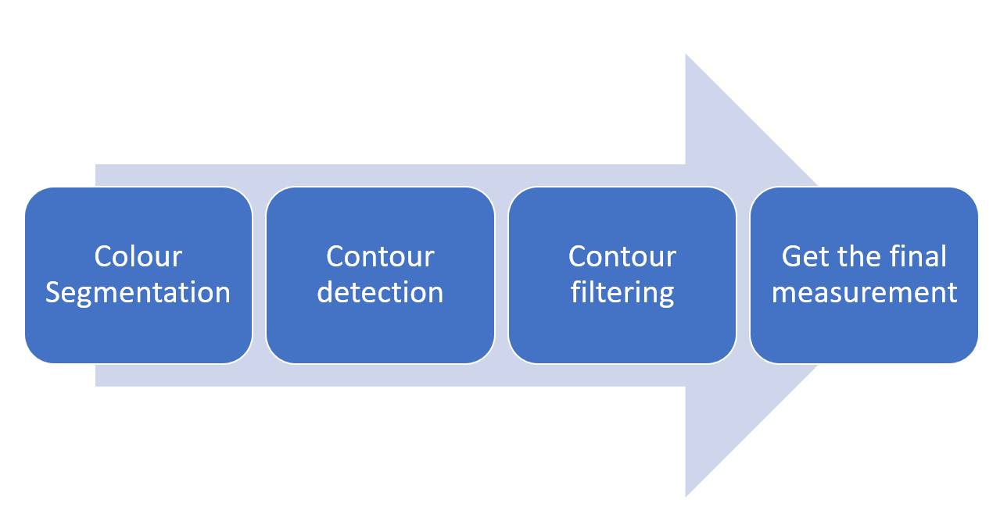

no. contours: 54


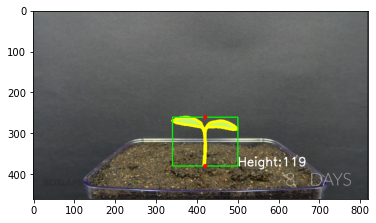

In [101]:
import cv2
import numpy as np

frame=cv2.imread("Resources\plants\D8.png")
height,width=frame.shape[0:2]

frame=cv2.resize(frame,(0,0),fx=0.6,fy=0.6)
hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

#Colour Segmentation 
lower_color = np.array([24,92,114])
upper_color = np.array([179,255,255])
mask = cv2.inRange(hsv,lower_color,upper_color)
res = cv2.bitwise_and(frame,frame, mask= mask)

#Contour Detection
contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
print('no. contours:',len(contours))

for cnt in contours:
    #cv2.drawContours(frame, [cnt], 0, (0,255,255), 3)
    area=cv2.contourArea(cnt)
    #print(area)
#    
    if(area>1000):
        cv2.drawContours(frame, [cnt], -1, (0,255,255),5)
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),2)
        cv2.circle(frame,(int(x+w/2),y),5,(0,0,255),-1)
        cv2.circle(frame,(int(x+w/2),y+h),5,(0,0,255),-1)
        cv2.putText(frame,"Height:"+str(h),(x+w,y+h),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)
        
#cv2.imshow('frame',hsv)
cv2.imshow('mask',frame)
cv2.imshow('IMAGE',frame)
plt.imshow(frame[:,:,::-1])

k = cv2.waitKey(0)
cv2.destroyAllWindows()

#### Run for a video stream

In [ ]:
import cv2
import numpy as np


source=cv2.VideoCapture(r"D:\#Image Processing\Resources\plants\v1.mp4")

while True:
    ret,frame=source.read()
    if ret==False:
        break
    else:
        #frame=cv2.resize(frame,(0,0),fx=0.6,fy=0.6)
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

        #Colour Segmentation 
        lower_color = np.array([24,92,114])
        upper_color = np.array([179,255,255])
        mask = cv2.inRange(hsv,lower_color,upper_color)
        res = cv2.bitwise_and(frame,frame, mask= mask)

        #Contour Detection
        contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
        #print('no. contours:',len(contours))

        for cnt in contours:
            #cv2.drawContours(frame, [cnt], 0, (0,255,255), 3)
            area=cv2.contourArea(cnt)
            #print(area)
        #    
            if(area>100):
                cv2.drawContours(frame, [cnt], -1, (0,255,255), 3)
                x,y,w,h = cv2.boundingRect(cnt)
                cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),2)
                cv2.circle(frame,(int(x+w/2),y),5,(0,0,255),-1)
                cv2.circle(frame,(int(x+w/2),y+h),5,(0,0,255),-1)
                cv2.putText(frame,"Height:"+str(h),(x+w,y+h),cv2.FONT_HERSHEY_SIMPLEX,1,(25,25,55),2)

        cv2.imshow('frame',frame)
        cv2.imshow('mask',res)
        k = cv2.waitKey(100)
        if k==27:
            break

cv2.destroyAllWindows()

## 6. Object Detection using Haarcascade Classifiers

Object Detection using Haar feature-based cascade classifiers is an effective object detection method proposed by Paul Viola and Michael Jones in their paper, "Rapid Object Detection using a Boosted Cascade of Simple Features" in 2001. It is a machine learning based approach where a cascade function is trained from a lot of positive and negative images. It is then used to detect objects in other images.

[read more @ OpenCV official documentation](https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html)


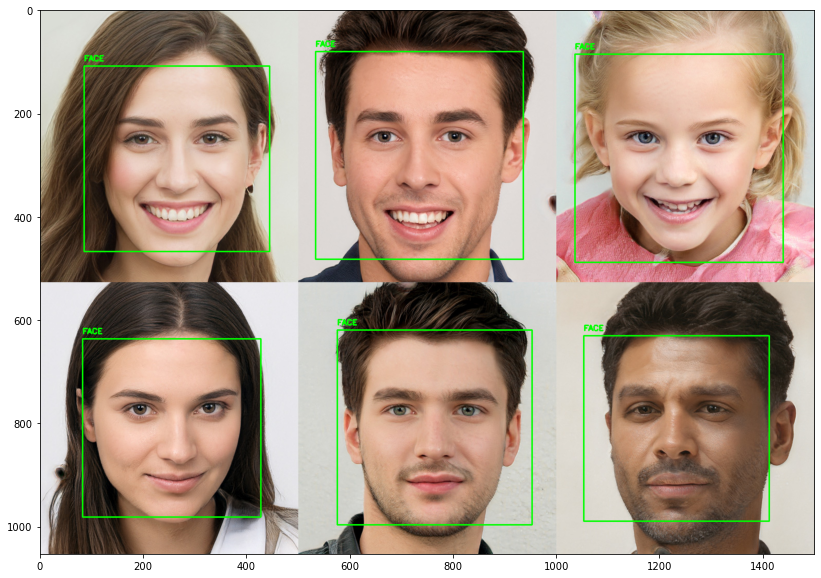

In [102]:
import cv2

face_clsfr=cv2.CascadeClassifier("D:\#Image Processing\Resources\Cascades\haarcascade_frontalface_default.xml")
img=cv2.imread("Resources/f2.jpg")

gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces=face_clsfr.detectMultiScale(gray)    
if len(faces)>0:
    for face in faces:
            x=face[0]
            y=face[1]
            w=face[2]
            h=face[3]

            cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
            cv2.putText(img,'FACE',(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,255,0),2)

#cv2.imwrite("Faces1.png",img)
img_resized=cv2.resize(img,(0,0),fx=0.7,fy=0.7)
cv2.imshow('IMAGE',img_resized)
plt.figure(figsize=(16,10))
plt.imshow(img[:,:,::-1])
key=cv2.waitKey(0)
        
cv2.destroyAllWindows()

### Detection Face + Eyes

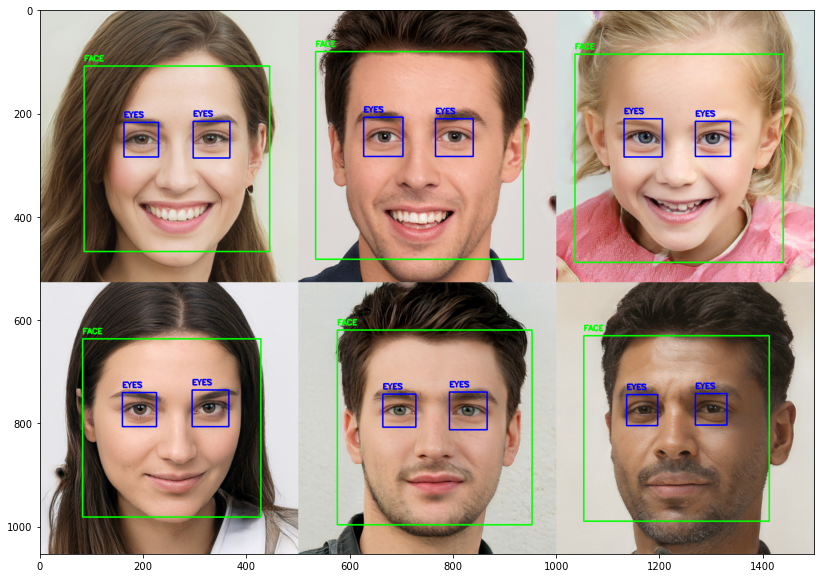

In [103]:
import cv2

face_clsfr=cv2.CascadeClassifier('D:\#Image Processing\Resources\Cascades\haarcascade_frontalface_default.xml')
eye_clsfr=cv2.CascadeClassifier('D:\#Image Processing\Resources\Cascades\haarcascade_eye_tree_eyeglasses.xml')

img=cv2.imread("Resources/f2.jpg")

gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces=face_clsfr.detectMultiScale(gray)     

for face in faces:
        x=face[0]
        y=face[1]
        w=face[2]
        h=face[3]
        
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
        cv2.putText(img,'FACE',(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,255,0),2)

        face_img=gray[y:y+w,x:x+w]

        eyes=eye_clsfr.detectMultiScale(face_img)

        for(ex,ey,ew,eh) in eyes:
            cv2.rectangle(img,(x+ex,y+ey),(x+ex+ew,y+ey+eh),(255,0,0),2)
            cv2.putText(img,'EYES',(x+ex,y+ey-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(255,0,0),2)


img_resized=cv2.resize(img,(0,0),fx=0.7,fy=0.7)
cv2.imshow('IMAGE',img_resized)
plt.figure(figsize=(16,10))
plt.imshow(img[:,:,::-1])
key=cv2.waitKey(0)
        
cv2.destroyAllWindows()

### From live videofeed - Face detection

In [ ]:
import cv2

face_clsfr=cv2.CascadeClassifier("D:\#Image Processing\Resources\Cascades\haarcascade_frontalface_default.xml")
source=cv2.VideoCapture(0)

while(True):

    ret,img=source.read()
    gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    faces=face_clsfr.detectMultiScale(gray,1.3,5)     
    if len(faces)>0:
        for face in faces:

            x=face[0]
            y=face[1]
            w=face[2]
            h=face[3]

            cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
            cv2.putText(img,'FACE',(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,255,0),2)
                                   
    cv2.imshow('LIVE',img)
    key=cv2.waitKey(1)
    
    if(key==27):
        break
        
cv2.destroyAllWindows()
source.release()

### Face + Eyes

In [ ]:
import cv2

face_clsfr=cv2.CascadeClassifier('D:\#Image Processing\Resources\Cascades\haarcascade_frontalface_default.xml')
eye_clsfr=cv2.CascadeClassifier('D:\#Image Processing\Resources\Cascades\haarcascade_eye_tree_eyeglasses.xml')

source=cv2.VideoCapture("Resources/Coca.mp4")

while(True):

    ret,img=source.read()
    gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    faces=face_clsfr.detectMultiScale(gray)     

    for face in faces:
        x,y,w,h=face
        
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
        cv2.putText(img,'FACE',(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,255,0),2)

        face_img=gray[y:y+w,x:x+w]

        eyes=eye_clsfr.detectMultiScale(face_img)

        for(ex,ey,ew,eh) in eyes:

            cv2.rectangle(img,(x+ex,y+ey),(x+ex+ew,y+ey+eh),(255,0,0),2)
            cv2.putText(img,'EYES',(x+ex,y+ey-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(255,0,0),2)
    
    img=cv2.resize(img,(0,0),fx=0.7,fy=0.7)
    cv2.imshow('LIVE',img)
    key=cv2.waitKey(1)
    
    if(key==27):
        break
        
cv2.destroyAllWindows()
source.release()

## Explore yourself
### More Image Processing Aplications 

### Example 01 - Real Time Object Detection

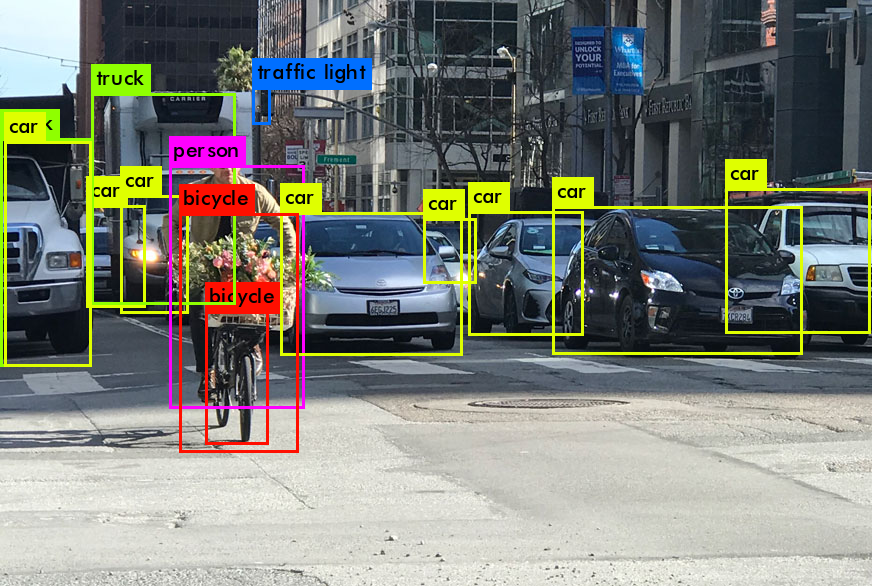

In [ ]:
import cv2
import numpy as np

net = cv2.dnn.readNet("Resources/Yolo/yolov3-tiny.weights", "Resources/Yolo/tiny.cfg")

classes = []
with open("Resources/Yolo/classes.txt", "r") as f:
    classes = f.read().splitlines()

cap = cv2.VideoCapture("Resources/Yolo/So Sri Lanka.mp4")
#cap=cv2.imread('agri_0_3378.jpeg')
font = cv2.FONT_HERSHEY_PLAIN
colors = np.random.uniform(0, 255, size=(100, 3))

while True:
    _, img = cap.read()
    height, width, _ = img.shape

    blob = cv2.dnn.blobFromImage(img, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
    net.setInput(blob)
    output_layers_names = net.getUnconnectedOutLayersNames()
    layerOutputs = net.forward(output_layers_names)

    boxes = []
    confidences = []
    class_ids = []

    for output in layerOutputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.2:
                center_x = int(detection[0]*width)
                center_y = int(detection[1]*height)
                w = int(detection[2]*width)
                h = int(detection[3]*height)

                x = int(center_x - w/2)
                y = int(center_y - h/2)

                boxes.append([x, y, w, h])
                confidences.append((float(confidence)))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.2, 0.4)

    if len(indexes)>0:
        for i in indexes.flatten():
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            confidence = str(round(confidences[i],2))
            color = colors[i]
            cv2.rectangle(img, (x,y), (x+w, y+h), color, 2)
            cv2.putText(img, label + " " + confidence, (x, y+20), font, 2, (255,255,255), 2)
            

    cv2.imshow('Image', img)
    key = cv2.waitKey(1)
    if key==27:
        break

cap.release()
cv2.destroyAllWindows()

### Example 02 - Face Recognition

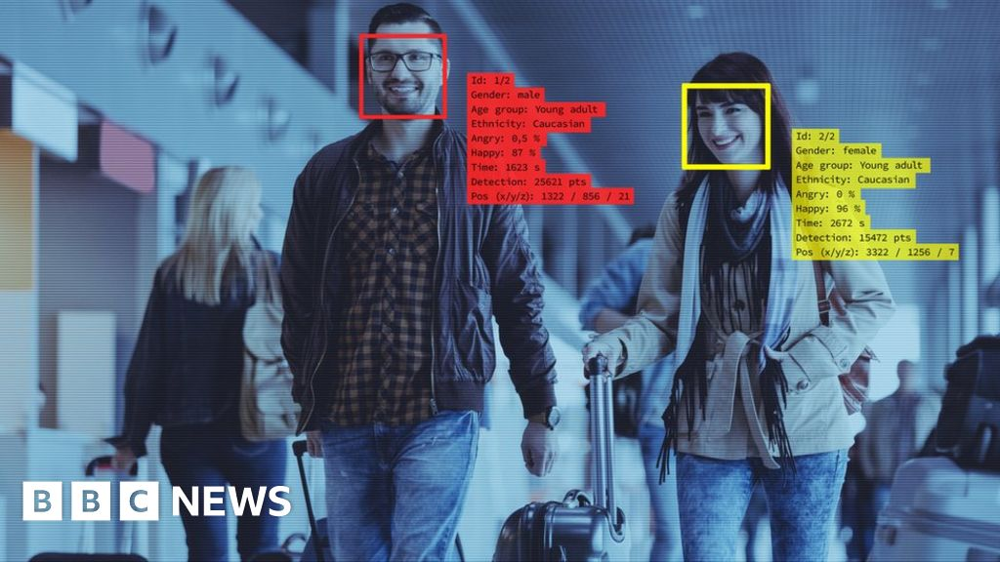

In [4]:
###Capture and add image to the database
import os
import cv2

name="Madawa"
count=0

parent_dir = "D:\#UNI work\#Image Processing\Resources\Known"
path = os.path.join(parent_dir, name)

try:
    os.mkdir(path)
    print("Directory '% s' created" % name)
except FileExistsError:
    print("file already exists")

source=cv2.VideoCapture(0)

while(True):
    ret,img=source.read()
    if(ret==False):
        break
    
    cv2.imshow('IMG',img)
    key=cv2.waitKey(100)
    if(key==27):
        break
    
    if key==ord("s"):
        count=count+1
        cv2.imwrite(path+"/"+name+str(count)+".jpg",img)
        print("Saved")
        cv2.imshow('IMG1',img)
    
cv2.destroyAllWindows()


Directory 'Madawa' created
Saved
Saved


In [7]:
#Getting image to be predicted
char="M"
count=0
unknow_dir="Resources/Unknown"

source=cv2.VideoCapture(0)

while(True):
    ret,img=source.read()
    if(ret==False):
        break
    
    cv2.imshow('IMG',img)
    key=cv2.waitKey(100)
    if(key==27):
        break
    
    if key==ord("s"):
        count=count+1
        cv2.imwrite(unknow_dir+"/"+char+str(count)+".jpg",img)
        print("Saved")
        cv2.imshow('IMG1',img)
    
cv2.destroyAllWindows()

Saved
Saved
Saved


In [6]:
cv2.destroyAllWindows()

In [8]:
import face_recognition
import cv2
import os
import random

img_num=random.randint(0,100000)
def show_image(img,scale=0.2,save=False):
    global img_num
    img_num=img_num+1
    img_resized=cv2.resize(img,(0,0),fx=scale,fy=scale)
    cv2.imshow("Image",img_resized)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    if (save):
        cv2.imwrite("Resources/Save/"+str(img_num)+".png",img)
        print(f"image savesd in Resources/Save/{img_num}.png")
    

known_encordings=[]
known_names=[]
know_dir="Resources/Known"

for file in os.listdir(know_dir):
    for people in os.listdir(os.path.join(know_dir,file)):
        image=cv2.imread(know_dir+"/"+file+"/"+people)
        #show_image(image,scale=0.4)
        img_enc=face_recognition.face_encodings(image)[0]
        known_encordings.append(img_enc)
        known_names.append(file)

print("Done Extracting")
col=(255,0,255)
ln=10
t=3

unknow_dir="Resources/Unknown"        
for img_name in os.listdir(unknow_dir):
    print("Processing",img_name)
    image=cv2.imread(unknow_dir+"/"+img_name)
    img_positions=face_recognition.face_encodings(image)
    locations=face_recognition.face_locations(image)##model="cnn")
    people=[]
    for face_num in range(len(img_positions)):
        results=face_recognition.compare_faces(known_encordings,img_positions[face_num])
        #print(results)
        count=0
        while(True in results):
            idx=results.index(True)
            #print(people,known_names[idx])
            if (known_names[idx] not in people):
                people.append(known_names[idx])
                count=count+1
                #print(known_names[idx])
                (y,x_bottom,y_bottom,x)=locations[face_num]
                #print(x,y,x_bottom,y_bottom)
                cv2.rectangle(image,(x,y),(x_bottom,y_bottom),col,1)
                    
                cv2.line(image,(x,y),(x+ln,y),col,t)
                cv2.line(image,(x,y),(x,y+ln),col,t)
                
                cv2.line(image,(x_bottom,y),(x_bottom-ln,y),col,t)
                cv2.line(image,(x_bottom,y),(x_bottom,y+ln),col,t)
                
                cv2.line(image,(x,y_bottom),(x+ln,y_bottom),col,t)
                cv2.line(image,(x,y_bottom),(x,y_bottom-ln),col,t)
                
                cv2.line(image,(x_bottom,y_bottom),(x_bottom-ln,y_bottom),col,t)
                cv2.line(image,(x_bottom,y_bottom),(x_bottom,y_bottom-ln),col,t)   
                
                #cv2.putText(image,"Mio",(x+2,y-10),cv2.FONT_HERSHEY_SIMPLEX,1,(0,153,255),2)
            
                cv2.putText(image,known_names[idx],(x+2,y-10),cv2.FONT_HERSHEY_SIMPLEX,1,(0,153,255),2)
            
            elif(count==1):
                break
            
            else:
                #pass
                #del results[idx]
                results[idx]=False
                #people.remove(known_names[idx])
            
        if (True not in results):
            (y,x_bottom,y_bottom,x)=locations[face_num]
            #print(x,y,x_bottom,y_bottom)
            #print("Unknown")
            cv2.rectangle(image,(x,y),(x_bottom,y_bottom),col,1)
                
            cv2.line(image,(x,y),(x+ln,y),col,t)
            cv2.line(image,(x,y),(x,y+ln),col,t)
            
            cv2.line(image,(x_bottom,y),(x_bottom-ln,y),col,t)
            cv2.line(image,(x_bottom,y),(x_bottom,y+ln),col,t)
            
            cv2.line(image,(x,y_bottom),(x+ln,y_bottom),col,t)
            cv2.line(image,(x,y_bottom),(x,y_bottom-ln),col,t)
            
            cv2.line(image,(x_bottom,y_bottom),(x_bottom-ln,y_bottom),col,t)
            cv2.line(image,(x_bottom,y_bottom),(x_bottom,y_bottom-ln),col,t)
                #l_text=int((x_bottom-x_top)*0.75)-15
                #h_text=(y_bottom-y_top)//6
                #cv2.rectangle(image,(x_top,y_top-60),(x_top+l_text,y_top),(0,255,0),-1)
            cv2.putText(image,"Unkown",(x+2,y-10),cv2.FONT_HERSHEY_SIMPLEX,1,(255,0,125),2)

    show_image(image,scale=1,save=True)


Done Extracting
Processing M.jpg
image savesd in Resources/Save/98936.png
Processing M1.jpg
image savesd in Resources/Save/98937.png
Processing M2.jpg
image savesd in Resources/Save/98938.png
Processing M3.jpg
image savesd in Resources/Save/98939.png


### Example 03 - Volume Control Using OpenCv and MediaPipe

In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import time
import random
import os
import math
#import pycaw

from ctypes import cast, POINTER
from comtypes import CLSCTX_ALL
from pycaw.pycaw import AudioUtilities, IAudioEndpointVolume

mpHnads=mp.solutions.hands
hands=mpHnads.Hands(min_detection_confidence=0.8)
mpDraw=mp.solutions.drawing_utils

devices = AudioUtilities.GetSpeakers()
interface = devices.Activate(
    IAudioEndpointVolume._iid_, CLSCTX_ALL, None)
volume = cast(interface, POINTER(IAudioEndpointVolume))
#volume.GetMute()
#volume.GetMasterVolumeLevel()
vol_range=volume.GetVolumeRange()
min_vol=vol_range[0]
max_vol=vol_range[1]

##-65.6 to 0
#%%%
vid=cv2.VideoCapture(0)
pTime=0

volume_bar=415
precentage=0

length=0
#result = cv2.VideoWriter("Outputs/Output_1.avi",cv2.VideoWriter_fourcc(*'MJPG'), 10, (854,480))
while (True):
    ret,img=vid.read()
    img=cv2.flip(img,1)
    points=[]
    if (ret==0):
        break
    imgRGB=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    results=hands.process(imgRGB)

    if results.multi_hand_landmarks:
        for handLM in results.multi_hand_landmarks:
            for indx,lm in enumerate(handLM.landmark):
                h,w,c=img.shape
                cx,cy=int(lm.x*w),int(lm.y*h)
                points.append([indx,cx,cy])
                if (indx%4==0):
                    cv2.circle(img,(cx,cy),7,(12,234,143),-1)
            
            mpDraw.draw_landmarks(img,handLM,mpHnads.HAND_CONNECTIONS)
    
    if (len(points) != 0):  
        x1,y1=points[4][1],points[4][2]
        x2,y2=points[8][1],points[8][2]
        cv2.line(img,(x1,y1),(x2,y2),(255,0,255),3)
        cv2.circle(img,(x1,y1),8,(255,0,255),-1)
        cv2.circle(img,(x2,y2),8,(255,0,255),-1)
        cv2.circle(img,((x1+x2)//2,(y1+y2)//2),10,(255,0,255),-1)

        length_actual=math.hypot(x2-x1,y2-y1)
        length=min(250,length_actual)
        #print(length)
        if(length_actual <40):
            cv2.circle(img,((x1+x2)//2,(y1+y2)//2),10,(255,255,55),-1)
        if(length_actual >250):
            cv2.line(img,(x1,y1),(x2,y2),(0,0,255),3)
            cv2.circle(img,(x1,y1),8,(0,0,255),-1)
            cv2.circle(img,(x2,y2),8,(0,0,255),-1)
            cv2.circle(img,((x1+x2)//2,(y1+y2)//2),10,(0,0,255),-1)
             
        volume_level=np.interp(length,[50,250],[min_vol,max_vol])
        volume_bar=np.interp(length,[50,250],[410,80])
        precentage=np.interp(length,[50,250],[0,100])
        volume.SetMasterVolumeLevel(volume_level, None)
        
    else:
        volume_level=np.interp(length,[50,250],[min_vol,max_vol])
        volume_bar=np.interp(length,[50,250],[410,80])
        precentage=np.interp(length,[50,250],[0,100])
        volume.SetMasterVolumeLevel(volume_level, None)

    
    cv2.rectangle(img,(50,75),(85,420),(0,151,0),5)
    cv2.rectangle(img,(55,int(volume_bar)),(80,415),(0,151,0),-1)
    
    cv2.putText(img,str(int(precentage))+"%",(35,465),cv2.FONT_HERSHEY_SIMPLEX,1,(255,0,0),2)
    cTime=time.time()
    fps=1/(cTime-pTime)
    pTime=cTime
    cv2.putText(img,str(int(fps))+" fps",(10,35),cv2.FONT_HERSHEY_SIMPLEX,1,(0,128,255),2)
    
    cv2.imshow("Video",img)
    #sresult.write(img)
    k=cv2.waitKey(2)
    if (k==27):
        break
cv2.destroyAllWindows()
vid.release()


### Example 04 - Key landmarks detection

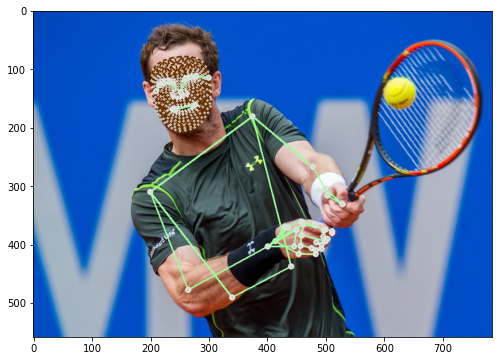

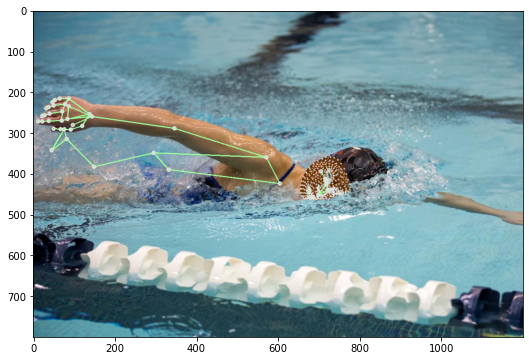

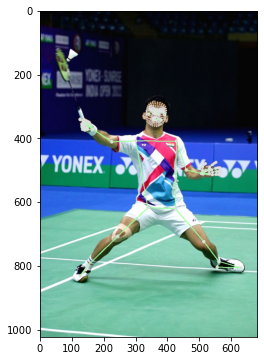

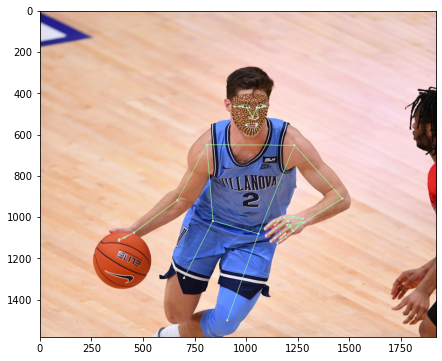

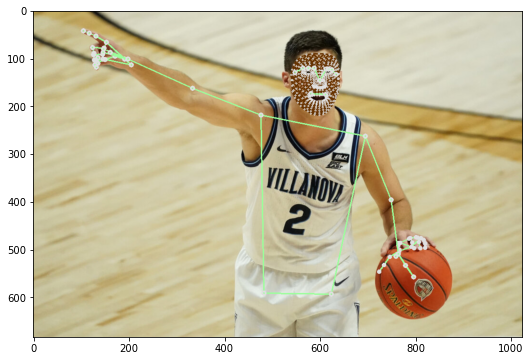

In [ ]:
import cv2
import mediapipe as mp
import time
import os
import random
from matplotlib import pyplot as plt

Option=1 ##0 for Videos ### 1 for Predict images in the folder(test_path) ###3 for Webcamera

mpPose=mp.solutions.holistic
mpDraw=mp.solutions.drawing_utils

face_drawing_spec = mpDraw.DrawingSpec(thickness=1, circle_radius=1)
face_connect_spec=mpDraw.DrawingSpec(thickness=2, circle_radius=1,color=(0,50,102))

left_hand_drawing_spec = mpDraw.DrawingSpec(thickness=2, circle_radius=2)
left_hand_connect_spec=mpDraw.DrawingSpec(thickness=2, circle_radius=2,color=(155,255,155))

right_hand_drawing_spec = mpDraw.DrawingSpec(thickness=2, circle_radius=3)
right_hand_connect_spec=mpDraw.DrawingSpec(thickness=2, circle_radius=2,color=(155,255,155))

pose_drawing_spec = mpDraw.DrawingSpec(thickness=2, circle_radius=3)
pose_connect_spec=mpDraw.DrawingSpec(thickness=2, circle_radius=2,color=(155,255,155))

test_path="Resources\Test_MediaPipe"

pT=0
Video_Path="D:\#Image Processing\Resources\Test_MediaPipe" ##Video in Video folder  ###0 for web Camera

if (Option==0):
    vid=cv2.VideoCapture(Video_Path)
    vid_resolution=(1280,720)
elif(Option==3):
    vid=cv2.VideoCapture(0)
    vid_resolution=(640,480)

def Pose_prediction(image):
    points=[]
    imgRGB=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    results=pose.process(imgRGB)
    
    if (results.pose_landmarks):
        mpDraw.draw_landmarks(image, results.face_landmarks, mpPose.FACEMESH_TESSELATION,landmark_drawing_spec=face_drawing_spec,connection_drawing_spec=face_connect_spec)
        mpDraw.draw_landmarks(image, results.left_hand_landmarks, mpPose.HAND_CONNECTIONS,landmark_drawing_spec=left_hand_drawing_spec,connection_drawing_spec=left_hand_connect_spec)
        mpDraw.draw_landmarks(image, results.right_hand_landmarks, mpPose.HAND_CONNECTIONS,landmark_drawing_spec=right_hand_drawing_spec,connection_drawing_spec=right_hand_connect_spec)
        mpDraw.draw_landmarks(image, results.pose_landmarks, mpPose.POSE_CONNECTIONS,landmark_drawing_spec=pose_drawing_spec,connection_drawing_spec=pose_connect_spec)
    return image,points
    
if((Option==0) or (Option==3)) :
        result = cv2.VideoWriter("Resources/Save/"+"Camera"+".avi",cv2.VideoWriter_fourcc(*'MJPG'),10, vid_resolution)
        pose=mpPose.Holistic()
        while True:                    
            ret,img=vid.read()
            if ret==0:
                break
            img=cv2.flip(img,1)
            img,points=Pose_prediction(img)
            cT=time.time()
            fps=1/(cT-pT)
            pT=cT
            cv2.putText(img,str(int(fps))+" fps",(18,35),cv2.FONT_HERSHEY_SIMPLEX,1,(255,0,255),2)
            cv2.imshow("LIVE",img)
            result.write(img)
            k=cv2.waitKey(1)
            if(k==27):
                break
          
else:
        pose=mpPose.Holistic(static_image_mode=True)
        img_names=os.listdir(test_path)
        
        for names in img_names:
            img=cv2.imread(os.path.join(test_path,names))
            img,points=Pose_prediction(img)
            
            cv2.namedWindow("Pictures", cv2.WINDOW_NORMAL)
            cv2.imshow("Pictures",img)
            plt.figure(figsize=(10,6))
            plt.imshow(img[:,:,::-1])
            k=cv2.waitKey(3000)
            if(k==27):
                break
                
cv2.destroyAllWindows()